# Trial End

In [1]:
import matplotlib
# matplotlib.use("Qt5Agg")
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import signal, stats
import mat73
import re
from neurodsp.timefrequency import compute_wavelet_transform
from BCI2kReader import BCI2kReader as b2k
import os
import mne
from tabulate import tabulate
import IPython
import seaborn as sns
import scipy
import joblib

import statsmodels
from statsmodels import stats
from statsmodels.stats import multitest

# Import required code for visualizing example models
from fooof import FOOOF
from fooof.sim.gen import gen_power_spectrum
from fooof.sim.utils import set_random_seed
from fooof.plts.spectra import plot_spectra
from fooof.plts.annotate import plot_annotated_model
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series
from neurodsp.spectral import compute_spectrum, rotate_powerlaw
from neurodsp.plts.spectral import plot_power_spectra



In [16]:
def calculate_trial_end_average(sub_list, string_filter, roi):
    tfrs = []
    no_tfrs = []
    for subject in sub_list:

        # load data
        tmp_TFR = mne.time_frequency.read_tfrs(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/trial_end/{roi}-tfr.h5")
        
        # filter
        tfr_case = tmp_TFR[0][string_filter]

        # get mean and append
        tfrs.append(tfr_case.data.mean(axis = 0).mean(axis = 0))
        
    
    if any("LL" in subject for subject in sub_list):

        # get indicies of high/low samp rate subs
        first_ll_sub = [subject for subject in sub_list if "LL" in subject][0]
        ll_begin = sub_list.index(first_ll_sub)

        # high sampling rate
        washu_tfrs = np.asarray(tfrs[0:ll_begin])
        washu_tfrs_mean = washu_tfrs.mean(axis = 0)

        # Low sampling rate
        ll_tfrs = np.asarray(tfrs[ll_begin:])
        ll_tfrs_mean = ll_tfrs.mean(axis = 0)

        # combine
        all_subs_tfrs = np.stack((washu_tfrs_mean[:, ::2], ll_tfrs_mean[:, 0:2501]))
      
        # mean
        all_subs_average = all_subs_tfrs.mean(axis = 0)
        
    else:
        
        # high sampling rate
        washu_tfrs = np.asarray(tfrs)
        washu_tfrs_mean = washu_tfrs.mean(axis = 0)

        # mean
        all_subs_average = washu_tfrs_mean
        

    return all_subs_average

def plot_allsub_averages(array_average, title, fname):
    plt.rcParams['figure.figsize'] = [45, 35]
    plt.rcParams.update({'font.size': 38})
    matplotlib.rcParams['font.serif'] = 'Times New Roman'
    matplotlib.rcParams['font.family'] = 'serif'

    freqs = np.logspace(start = np.log10(1), stop = np.log10(150), num = 80, base = 10, endpoint = True)
    yticks = np.linspace(np.min(freqs),np.max(freqs),len(freqs))
    yticks_labels = np.round(freqs, 1)

    fig, ax = plt.subplots()
    i = ax.imshow(array_average, cmap = 'RdBu_r', interpolation="none", origin="lower", aspect = 'auto', extent=[-2, 2, freqs[0], freqs[-1]], vmin = -.15, vmax = .15)
    i2 = plt.axvline(x=0, color='black', linestyle='--')
    ax.set_yticks(yticks[::2])
    ax.set_yticklabels(yticks_labels[::2])
    bar = plt.colorbar(i)
    ax.set_title(title, fontsize=65, fontweight = "bold", pad=40)
    fig.savefig(fname, dpi=400)

## Hippocampus

In [18]:
sub_list = ['SLCH002', 'BJH016', 'BJH021', 'LL10', 'LL12', 'LL13']

all_subs_average_hc_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'hc')
all_subs_average_hc_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'hc')
all_subs_average_hc_die = calculate_trial_end_average(sub_list, 'died == 1', 'hc')
    

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL10/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL13/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/hc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pa

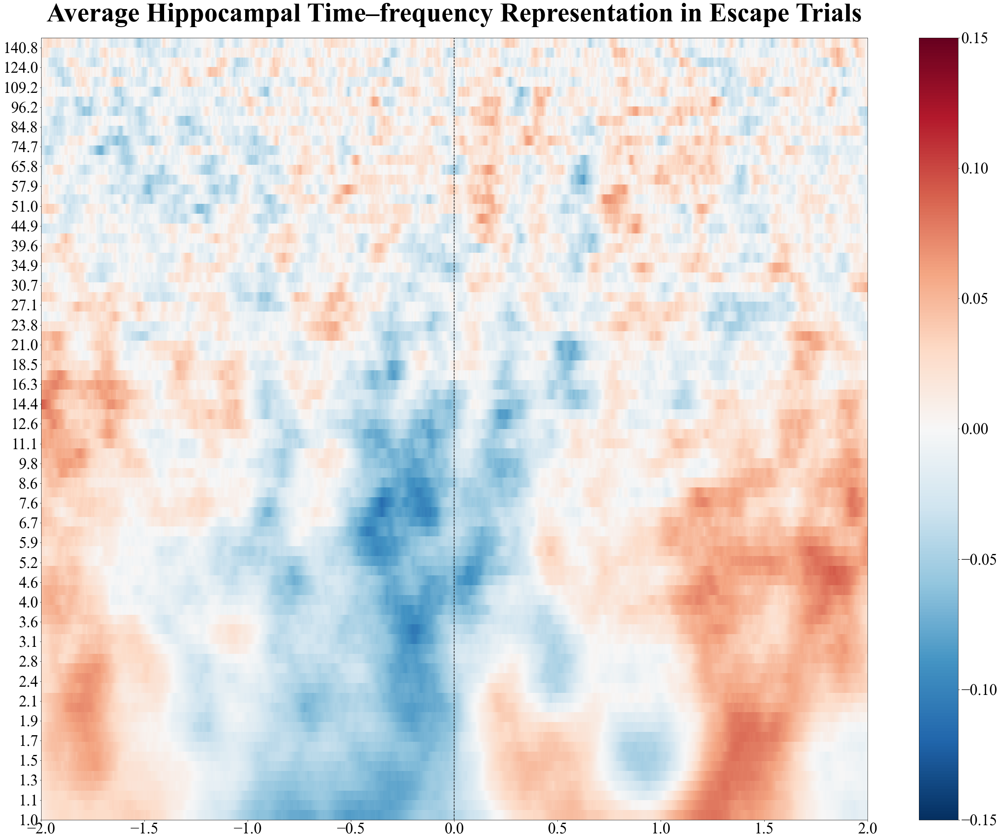

In [20]:
plot_allsub_averages(all_subs_average_hc_escape, "Average Hippocampal Time–frequency Representation in Escape Trials", 'average_hc_escape_all_subs.png')

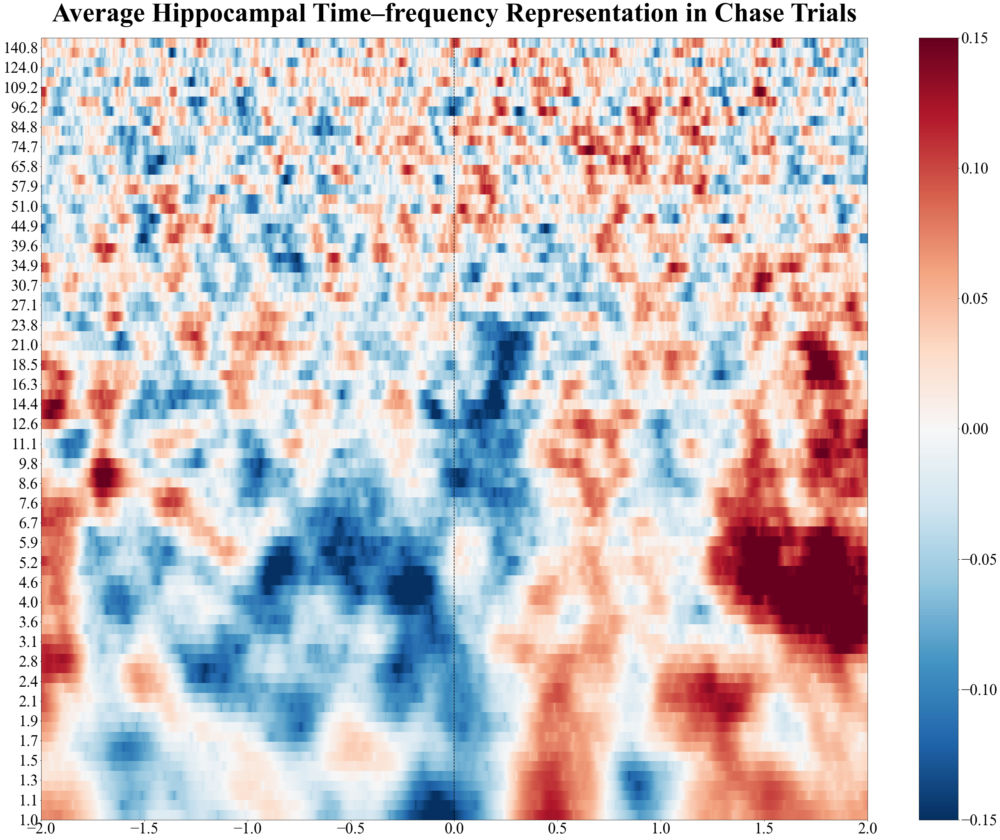

In [21]:
plot_allsub_averages(all_subs_average_hc_chase, "Average Hippocampal Time–frequency Representation in Chase Trials", 'average_hc_chase_all_subs.png')

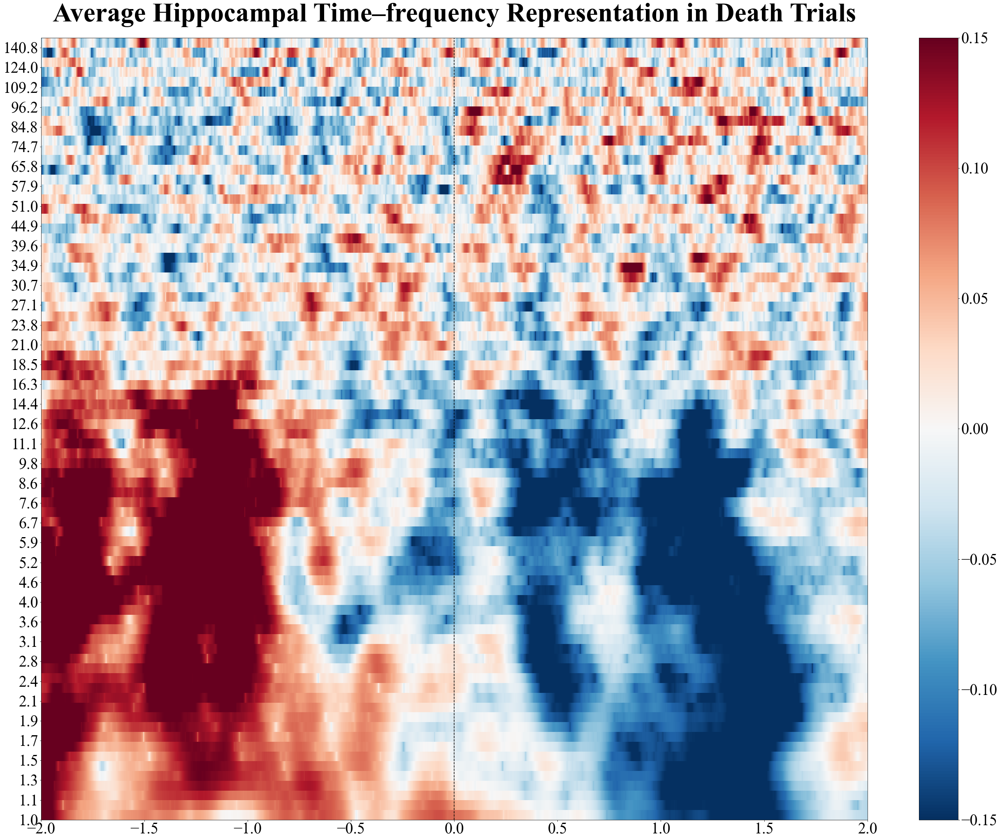

In [22]:
plot_allsub_averages(all_subs_average_hc_die, "Average Hippocampal Time–frequency Representation in Death Trials", 'average_hc_death_all_subs.png')

## OFC

In [23]:
sub_list = ['SLCH002', 'BJH016', 'BJH021', 'LL10', 'LL12', 'LL13']

all_subs_average_ofc_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'ofc')
all_subs_average_ofc_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'ofc')
all_subs_average_ofc_die = calculate_trial_end_average(sub_list, 'died == 1', 'ofc')
    

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL10/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL13/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/ofc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/

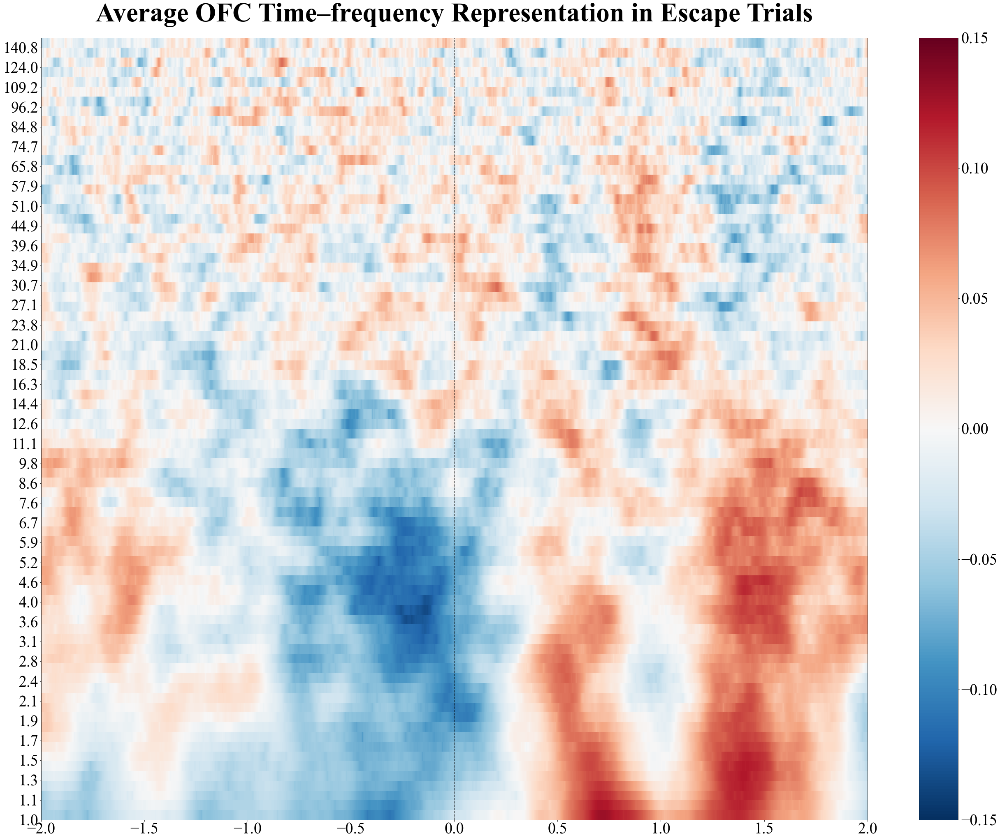

In [24]:
plot_allsub_averages(all_subs_average_ofc_escape, "Average OFC Time–frequency Representation in Escape Trials", 'average_ofc_escape_all_subs.png')

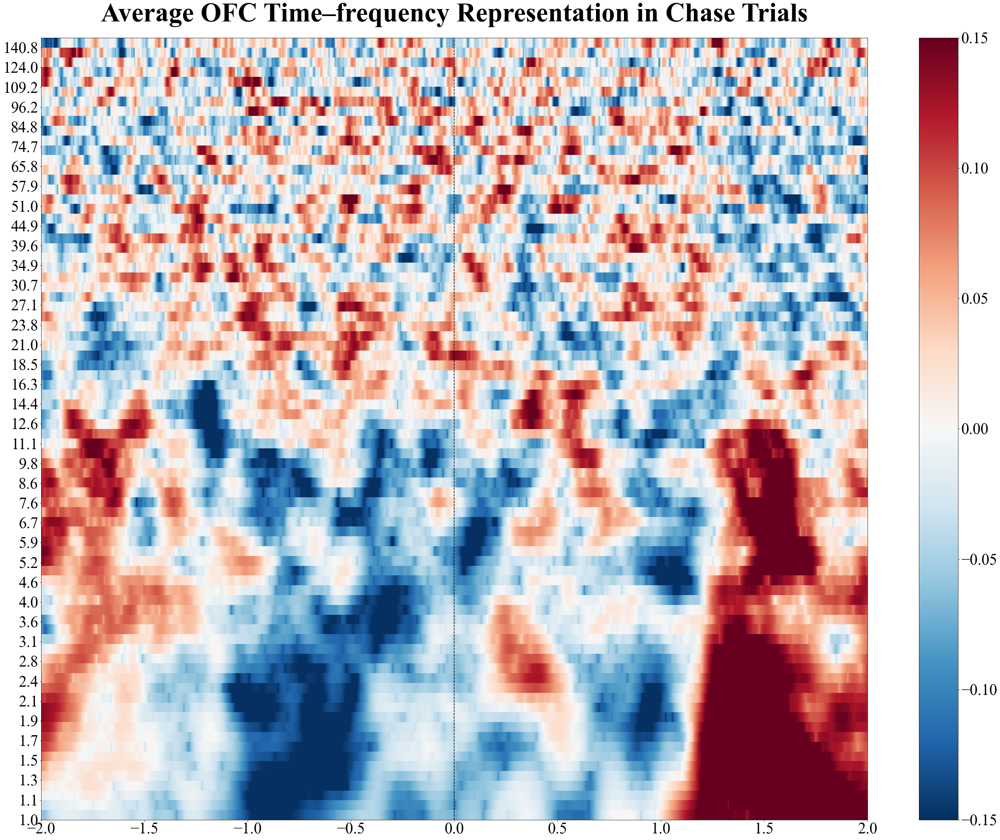

In [25]:
plot_allsub_averages(all_subs_average_ofc_chase, "Average OFC Time–frequency Representation in Chase Trials", 'average_ofc_chase_all_subs.png')

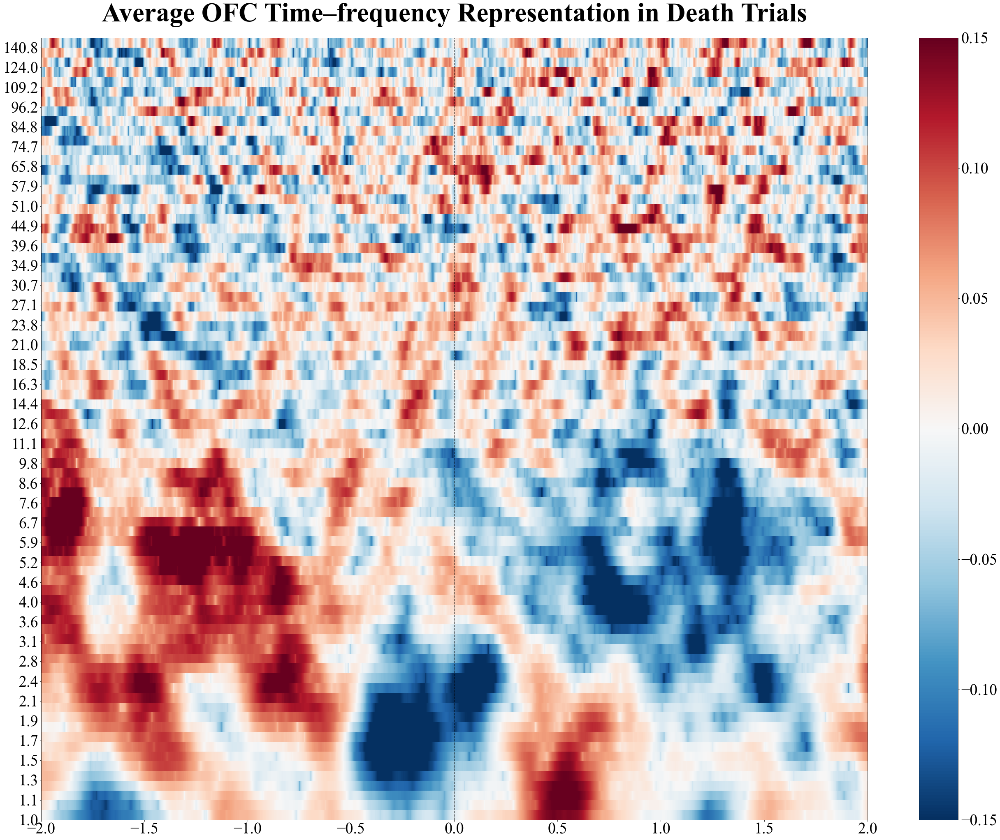

In [26]:
plot_allsub_averages(all_subs_average_ofc_die, "Average OFC Time–frequency Representation in Death Trials", 'average_ofc_death_all_subs.png')

## Anterior Cingulate

In [28]:
sub_list = ['SLCH002', 'BJH016', 'BJH021', 'LL10', 'LL12', 'LL13']

all_subs_average_cing_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'cing')
all_subs_average_cing_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'cing')
all_subs_average_cing_die = calculate_trial_end_average(sub_list, 'died == 1', 'cing')

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL10/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL13/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/cing-tfr.h5 ...
Adding metadata with 6 columns
Readi

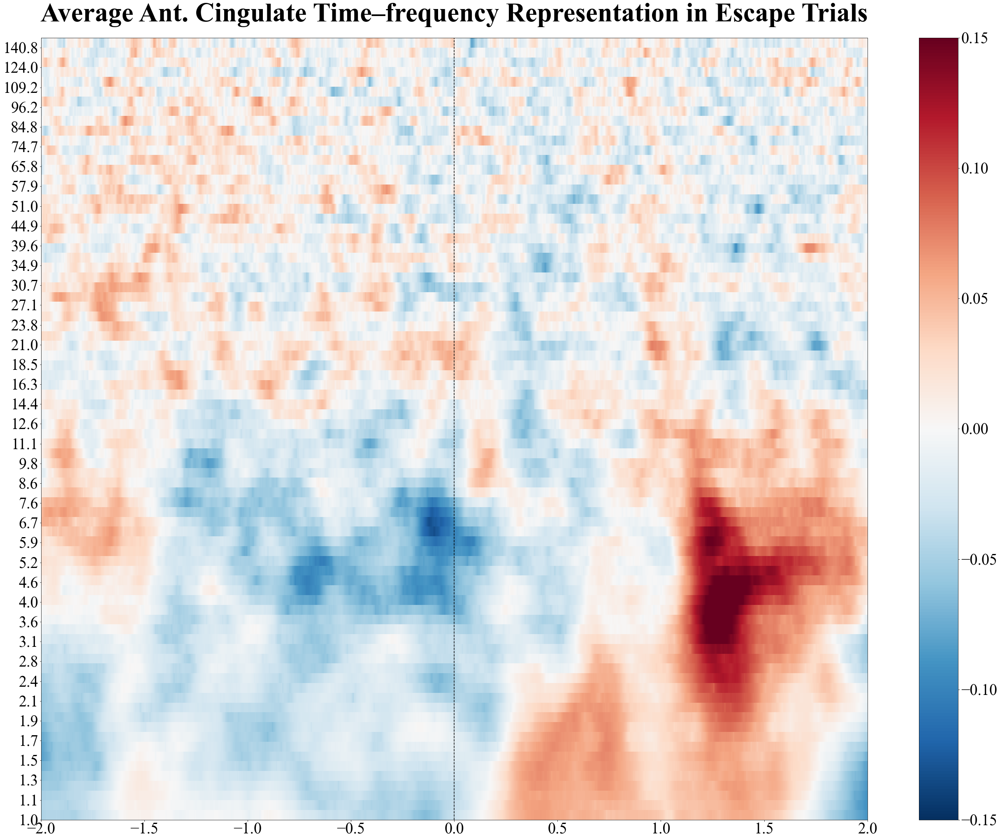

In [29]:
plot_allsub_averages(all_subs_average_cing_escape, "Average Ant. Cingulate Time–frequency Representation in Escape Trials", 'average_cing_escape_all_subs.png')

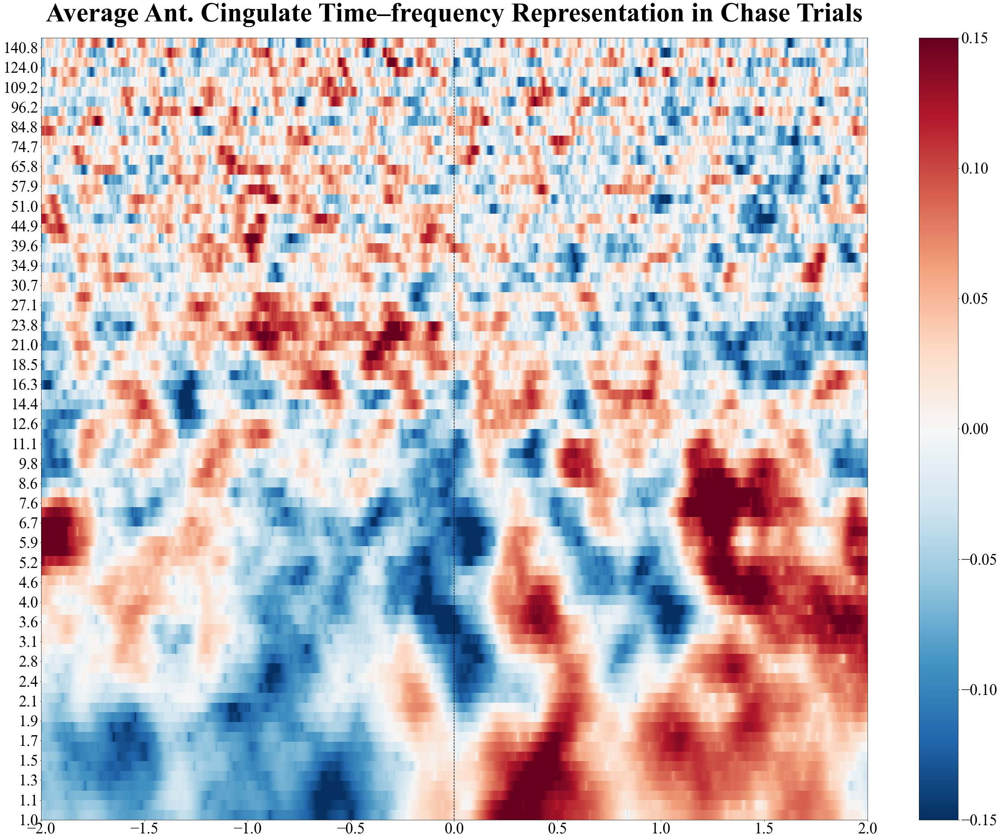

In [30]:
plot_allsub_averages(all_subs_average_cing_chase, "Average Ant. Cingulate Time–frequency Representation in Chase Trials", 'average_cing_chase_all_subs.png')

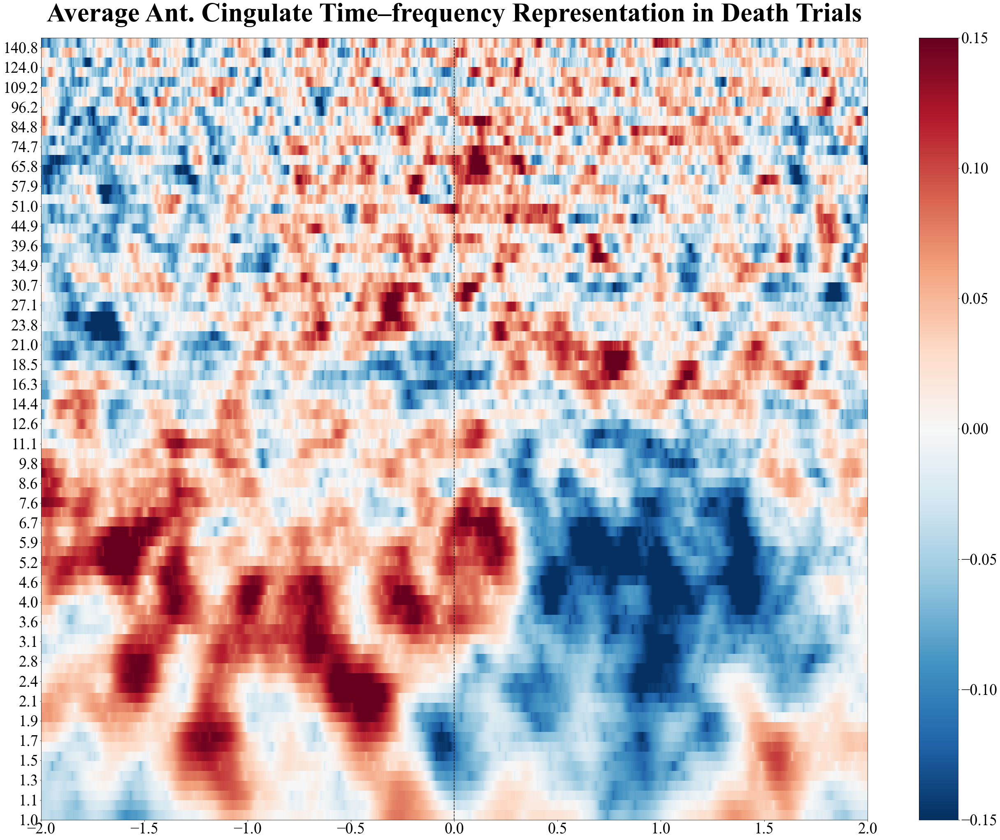

In [31]:
plot_allsub_averages(all_subs_average_cing_die, "Average Ant. Cingulate Time–frequency Representation in Death Trials", 'average_cing_death_all_subs.png')

## Amygdala

In [32]:
sub_list = ['SLCH002', 'BJH016', 'BJH021',  'LL10', 'LL12', 'LL13']

all_subs_average_amyg_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'amyg')
all_subs_average_amyg_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'amyg')
all_subs_average_amyg_die = calculate_trial_end_average(sub_list, 'died == 1', 'amyg')    

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL10/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL13/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/amyg-tfr.h5 ...
Adding metadata with 6 columns
Readi

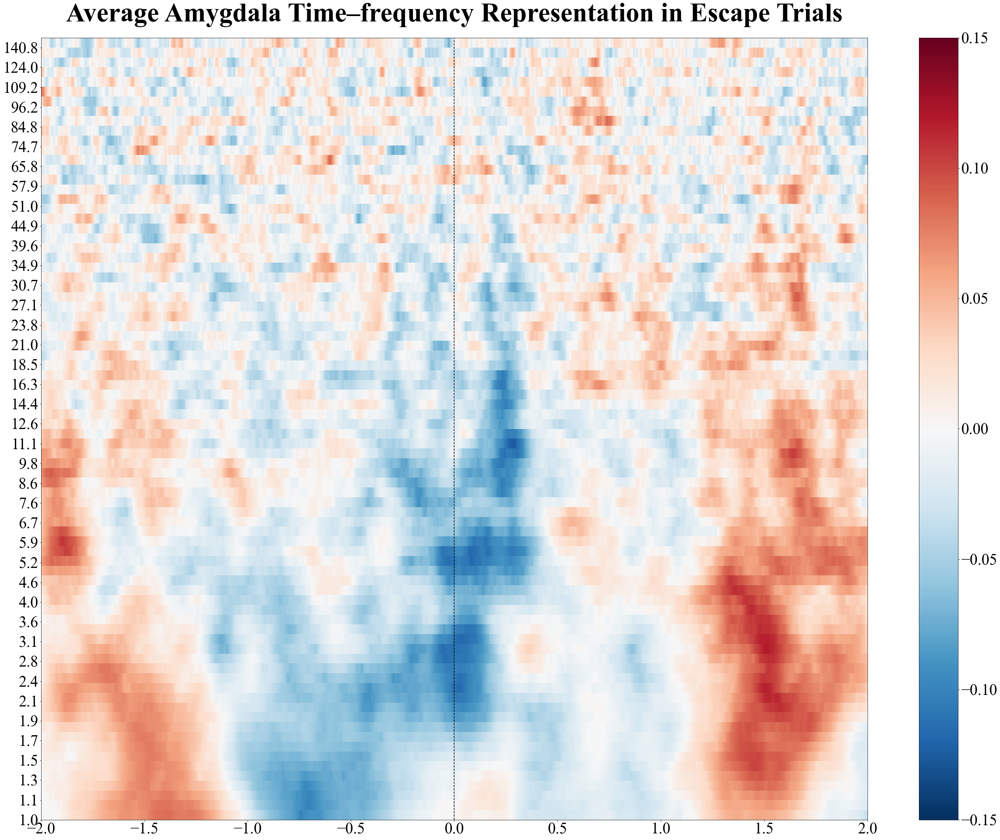

In [33]:
plot_allsub_averages(all_subs_average_amyg_escape, "Average Amygdala Time–frequency Representation in Escape Trials", 'average_amyg_escape_all_subs.png')

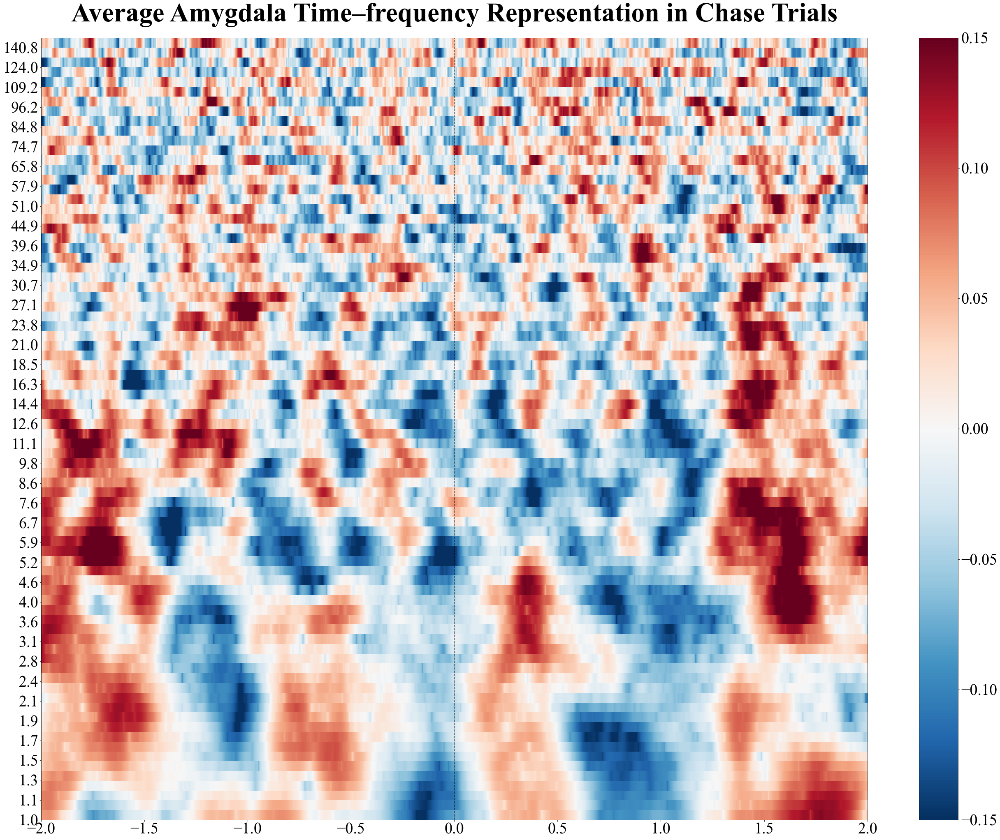

In [34]:
plot_allsub_averages(all_subs_average_amyg_chase, "Average Amygdala Time–frequency Representation in Chase Trials", 'average_amyg_chase_all_subs.png')

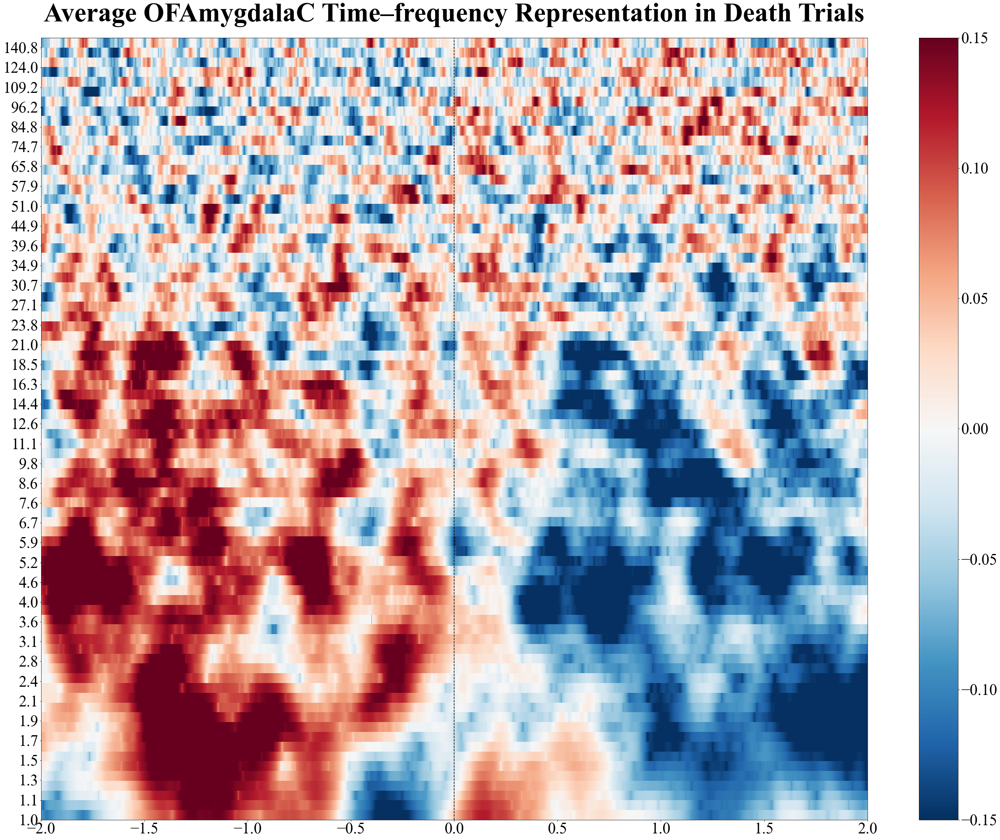

In [35]:
plot_allsub_averages(all_subs_average_amyg_die, "Average OFAmygdalaC Time–frequency Representation in Death Trials", 'average_amyg_death_all_subs.png')

# Other Regions

## dlPFC

In [36]:
sub_list = ['SLCH002', 'BJH016', 'BJH021', 'LL10', 'LL12', 'LL13']

all_subs_average_dlpfc_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'dlpfc')
all_subs_average_dlpfc_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'dlpfc')
all_subs_average_dlpfc_die = calculate_trial_end_average(sub_list, 'died == 1', 'dlpfc')

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL10/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/LL13/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/dlpfc-tfr.h5 ...
Adding metadata with 6 colu

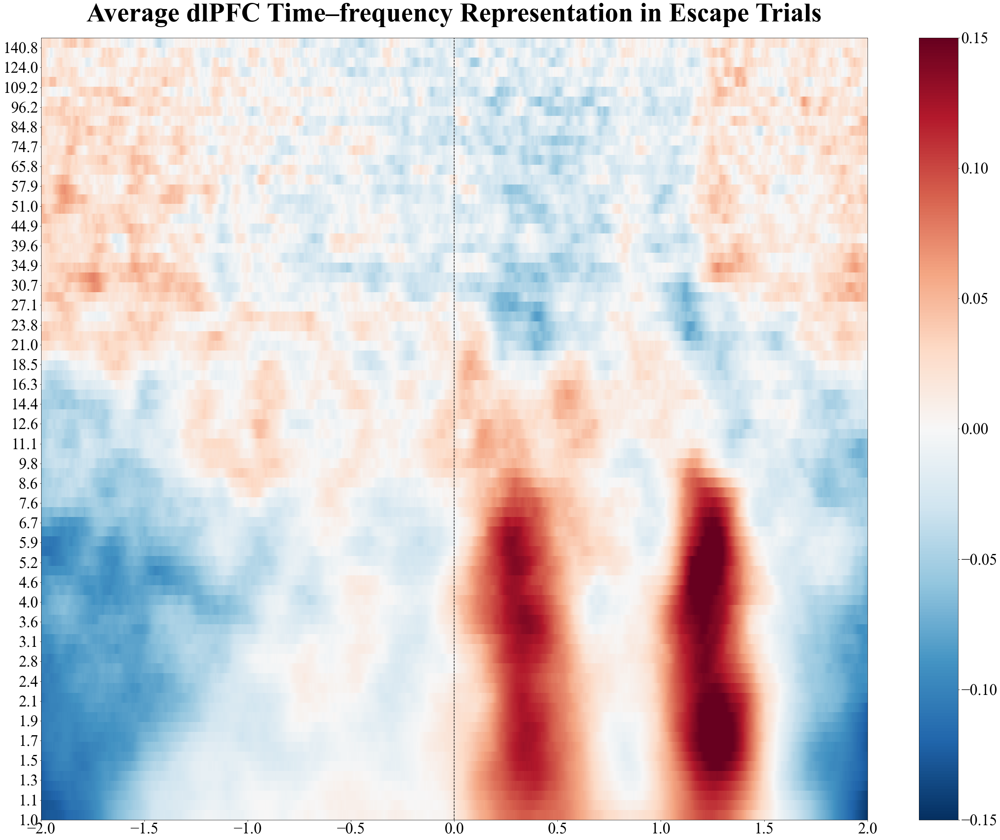

In [37]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average dlPFC Time–frequency Representation in Escape Trials", 'average_dlpfc_escape_all_subs.png')

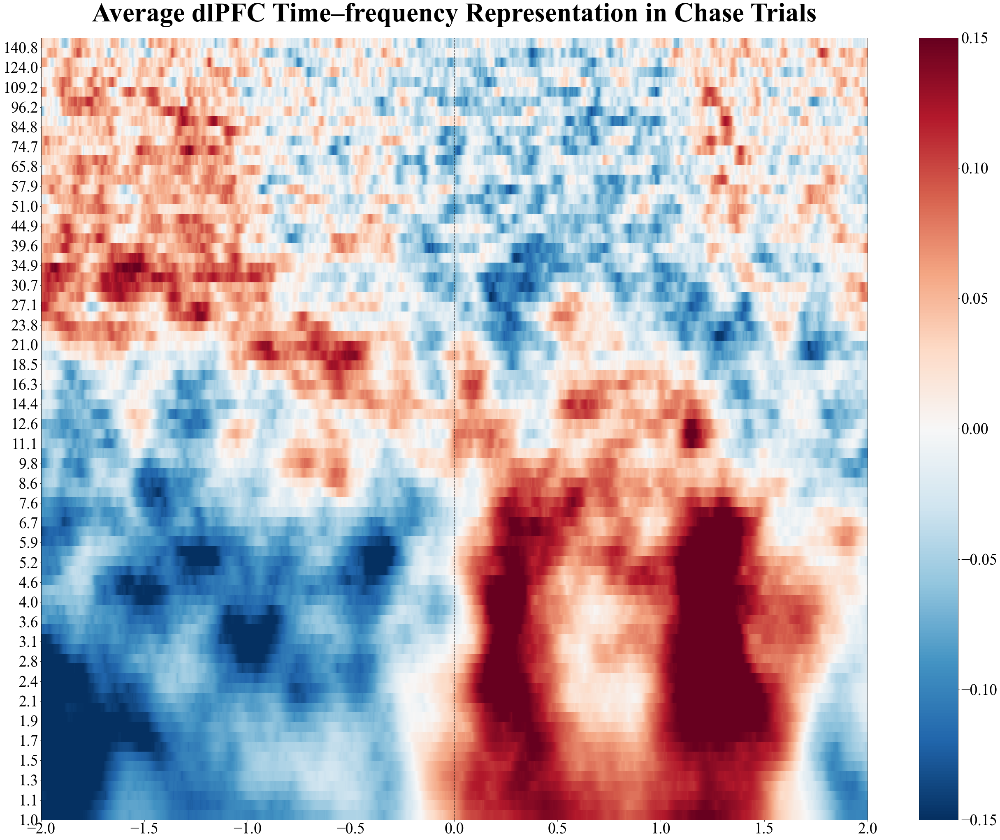

In [38]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average dlPFC Time–frequency Representation in Chase Trials", 'average_dlpfc_chase_all_subs.png')

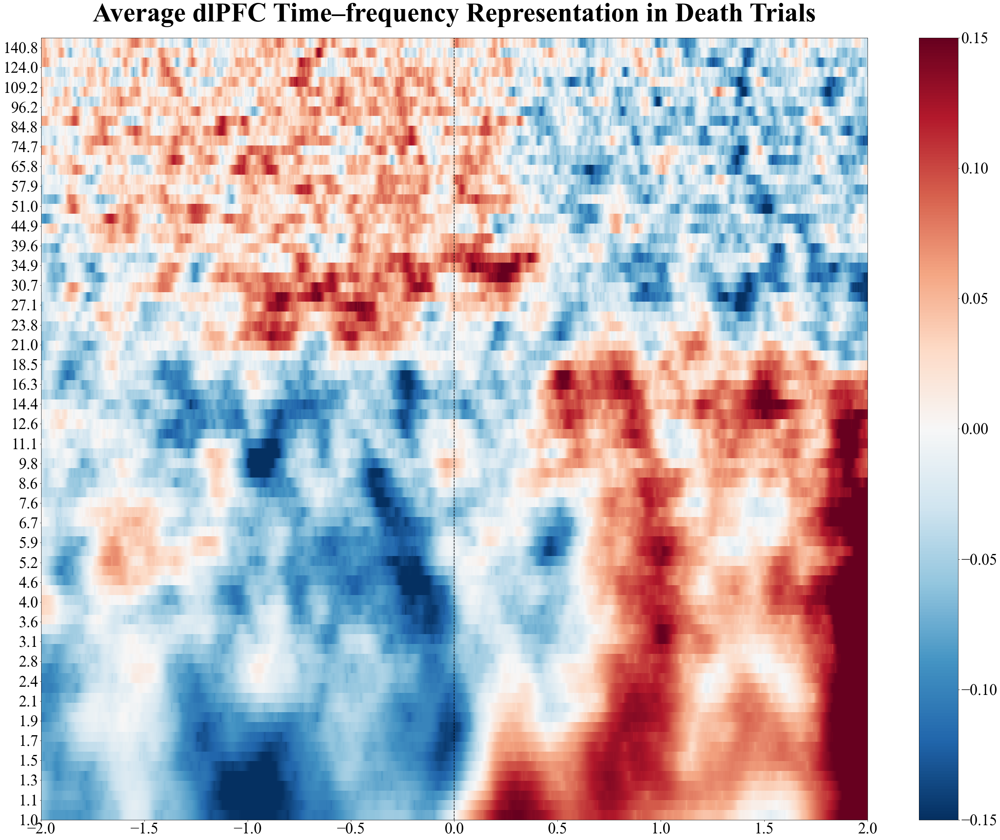

In [39]:
plot_allsub_averages(all_subs_average_dlpfc_die, "Average dlPFC Time–frequency Representation in Death Trials", 'average_dlpfc_death_all_subs.png')

## Insula

In [40]:
sub_list = ['SLCH002', 'BJH016', 'BJH021', 'LL12']

all_subs_average_insula_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'insula')
all_subs_average_insula_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'insula')
all_subs_average_insula_die = calculate_trial_end_average(sub_list, 'died == 1', 'insula')

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/BJH021/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/LL12/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/insula-tfr.h5 ...
Adding metadata

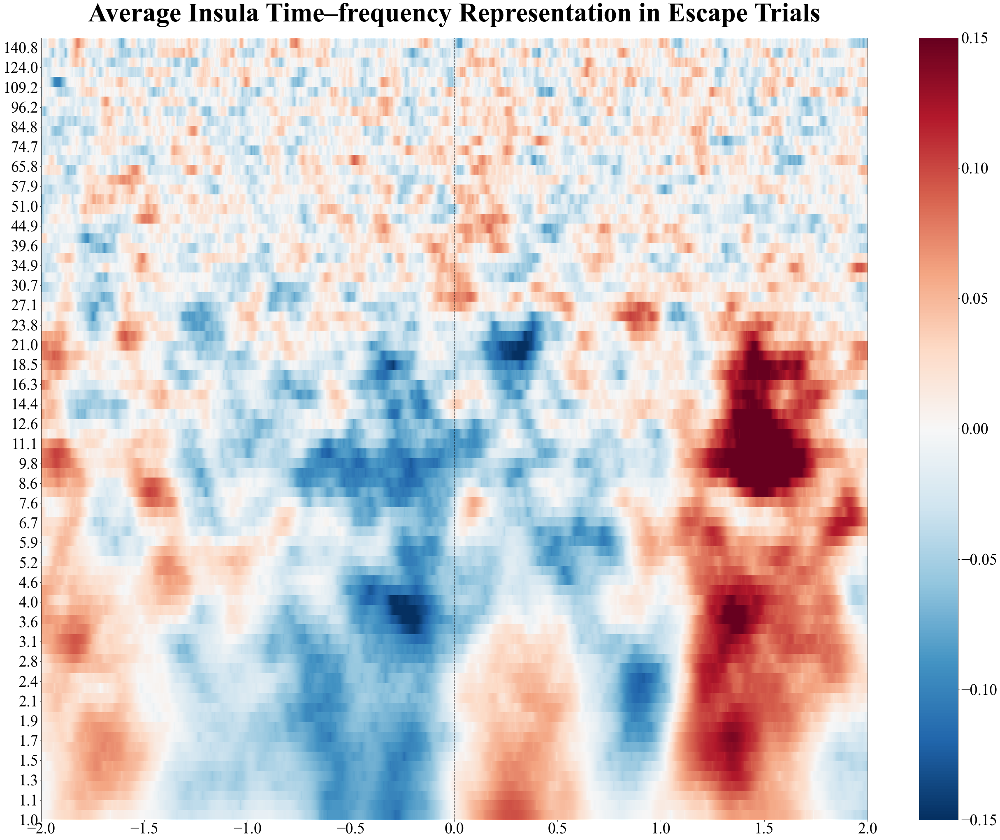

In [41]:
plot_allsub_averages(all_subs_average_insula_escape, "Average Insula Time–frequency Representation in Escape Trials", 'average_insula_escape_all_subs.png')

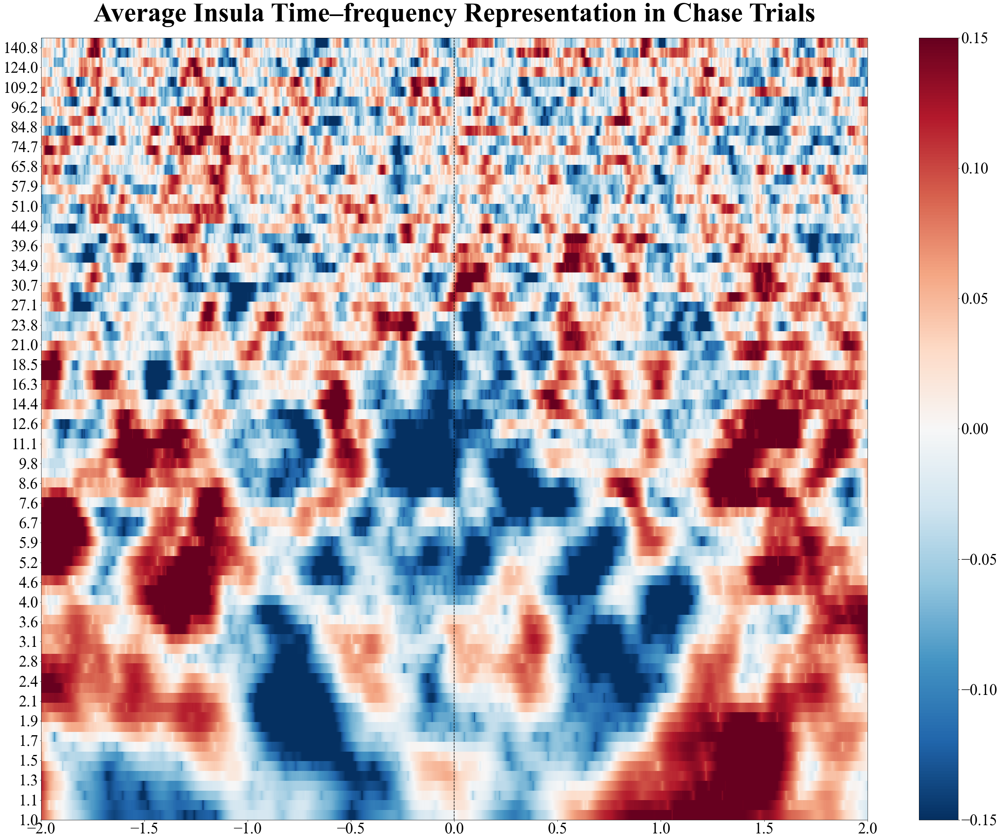

In [42]:
plot_allsub_averages(all_subs_average_insula_chase, "Average Insula Time–frequency Representation in Chase Trials", 'average_insula_chase_all_subs.png')

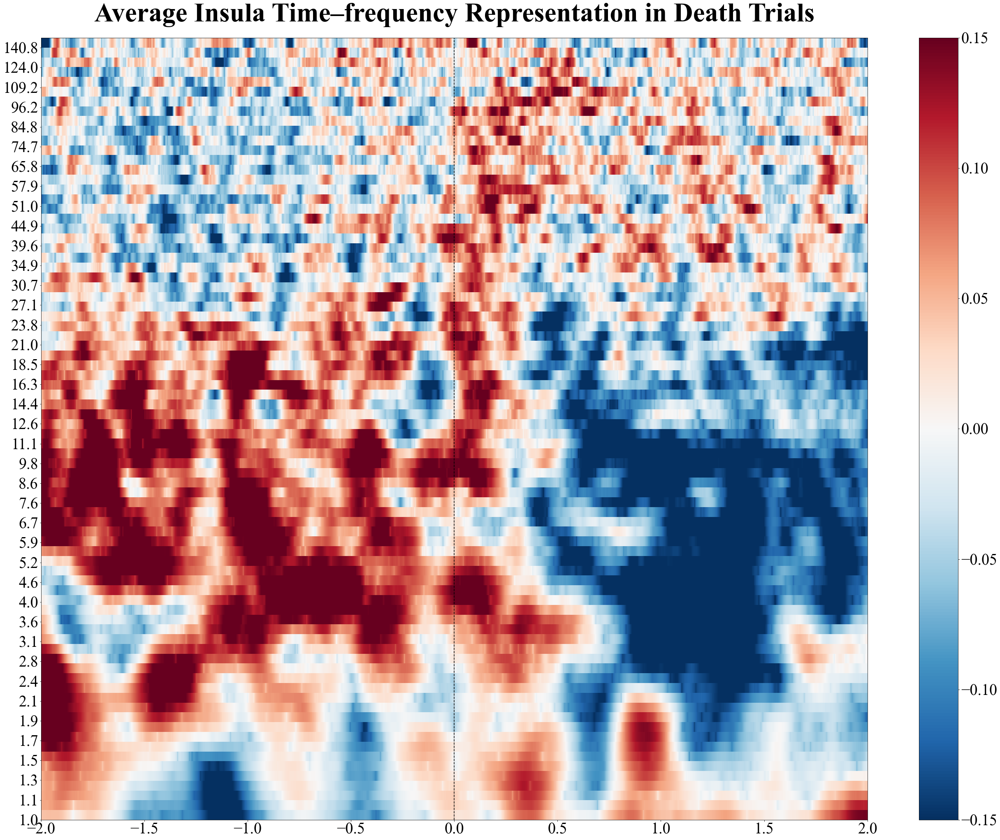

In [43]:
plot_allsub_averages(all_subs_average_insula_die, "Average Insula Time–frequency Representation in Death Trials", 'average_insula_death_all_subs.png')

## EC

In [44]:
sub_list = ['SLCH002', 'BJH016']

all_subs_average_ec_escape = calculate_trial_end_average(sub_list, 'chase_trial == 0 & died == 0', 'ec')
all_subs_average_ec_chase = calculate_trial_end_average(sub_list, 'chase_trial == 1', 'ec')
all_subs_average_ec_die = calculate_trial_end_average(sub_list, 'died == 1', 'ec')

Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 6 columns
Reading /home/brooke/pacman/preprocessing/SLCH002/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 5 columns
Reading /home/brooke/pacman/preprocessing/BJH016/ieeg/trial_end/ec-tfr.h5 ...
Adding metadata with 6 columns


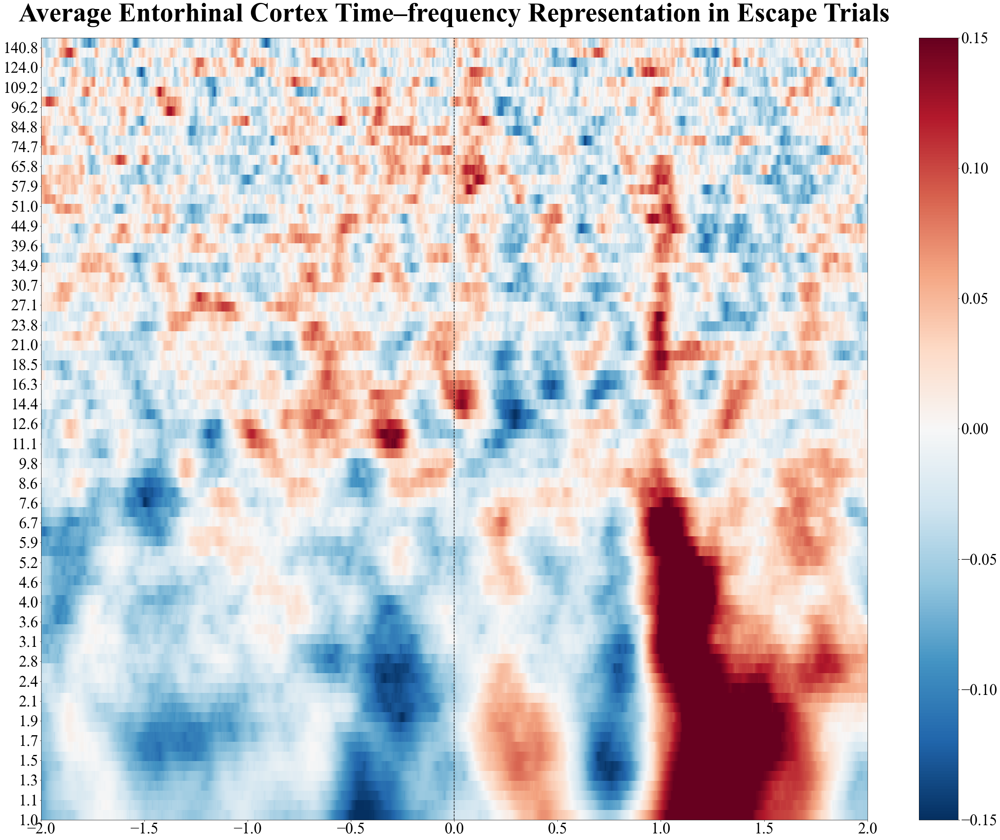

In [45]:
plot_allsub_averages(all_subs_average_ec_escape, "Average Entorhinal Cortex Time–frequency Representation in Escape Trials", 'average_ec_escape_all_subs.png')

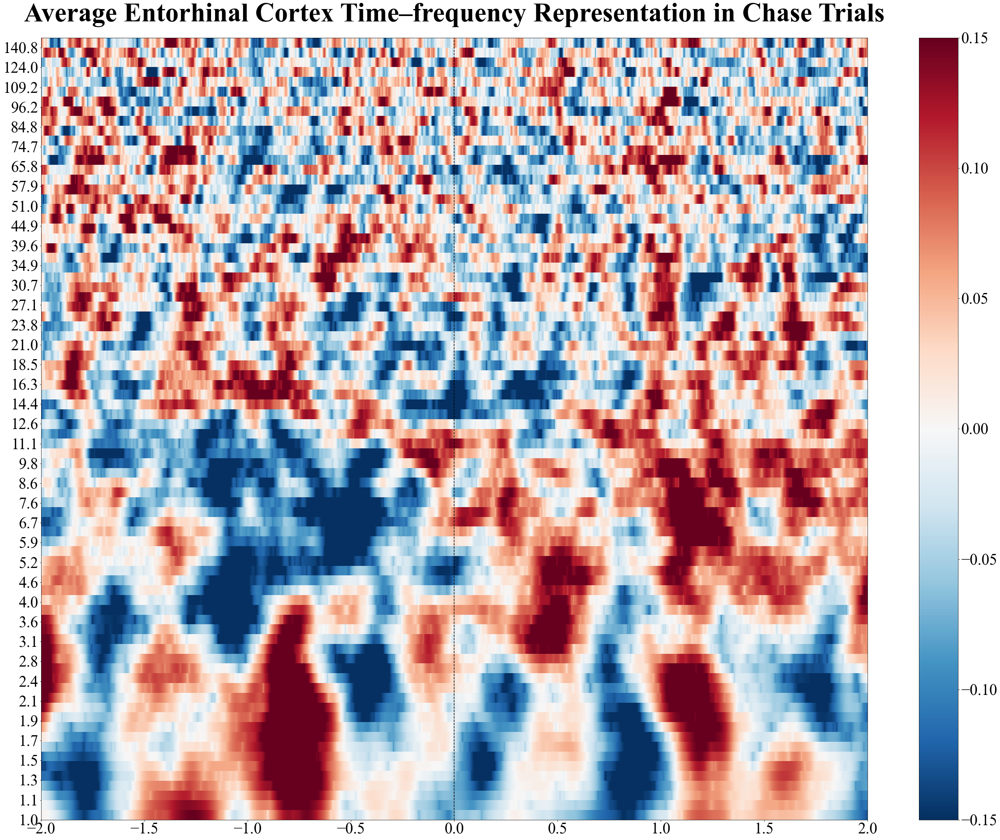

In [46]:
plot_allsub_averages(all_subs_average_ec_chase, "Average Entorhinal Cortex Time–frequency Representation in Chase Trials", 'average_ec_chase_all_subs.png')

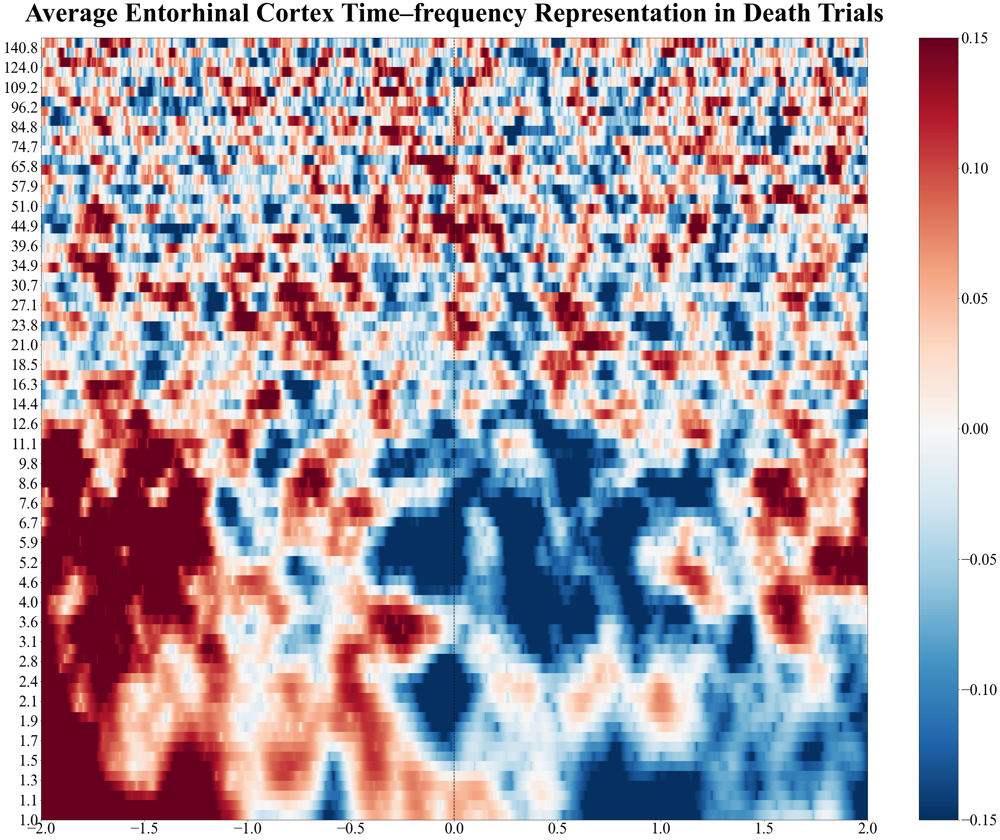

In [47]:
plot_allsub_averages(all_subs_average_ec_die, "Average Entorhinal Cortex Time–frequency Representation in Death Trials", 'average_ec_death_all_subs.png')